### Imports

In [26]:
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")
import tensorflow as tf
print("GPU: ", (len(tf.config.experimental.list_physical_devices("GPU"))))

from tensorflow.python.client import device_lib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers.normalization import BatchNormalization
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from keras.callbacks import TensorBoard
pd.set_option('display.max_columns', 60)
from keras.wrappers.scikit_learn import KerasClassifier
from keras.layers import Activation

print(device_lib.list_local_devices())


os.chdir(r"C:\Users\Áron\Desktop\Courses\csgo-ai-competition-master\dataset_initial")

GPU:  1
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 3522802534041320046
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 3138361753
locality {
  bus_id: 1
  links {
  }
}
incarnation: 3407180388456223326
physical_device_desc: "device: 0, name: GeForce GTX 1050 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1"
]


In [57]:
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")
import tensorflow as tf
print("GPU: ", (len(tf.config.experimental.list_physical_devices("GPU"))))

from tensorflow.python.client import device_lib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout

from tensorflow.keras.layers import BatchNormalization
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from keras.callbacks import TensorBoard
pd.set_option('display.max_columns', 60)
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.layers import Activation

print(device_lib.list_local_devices())


os.chdir(r"C:\Users\Áron\Desktop\Courses\csgo-ai-competition-master\dataset_initial")

GPU:  1
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 7486582216864081524
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 3138361753
locality {
  bus_id: 1
  links {
  }
}
incarnation: 3725398028252398762
physical_device_desc: "device: 0, name: GeForce GTX 1050 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1"
]


### Getting the data

In [184]:
%%time
def read_dataset(template, start_idx, end_idx):
    frames = [ pd.read_json(f) for f in [template.format(i) for i in range(start_idx, end_idx+1)] ]
    return pd.concat(frames, ignore_index = True)
    
X = read_dataset("dataset_{:02}.json", 0, 17)
y = X.pop('round_winner').map(lambda s: 0 if s == "CT" else 1)

Wall time: 9.4 s


In [185]:
display(X)

,map,current_score,round_status,round_status_time_left,alive_players,active_smokes,active_molotovs,previous_kills,planted_bomb
0,de_dust2,"[0, 0]",FreezeTime,20.000000,"[{'health': 100, 'armor': 0, 'has_helmet': Fal...",[],[],[],None
1,de_dust2,"[0, 0]",FreezeTime,1.031250,"[{'health': 100, 'armor': 100, 'has_helmet': F...",[],[],[],None
2,de_dust2,"[0, 0]",Normal,96.031250,"[{'health': 100, 'armor': 100, 'has_helmet': F...",[],[],"[{'weapon': 'Glock', 'attacker_position': {'x'...",None
3,de_dust2,"[0, 0]",Normal,76.031250,"[{'health': 100, 'armor': 100, 'has_helmet': F...","[{'position': {'x': 1184.4062, 'y': 2223.8438,...",[],"[{'weapon': 'Glock', 'attacker_position': {'x'...",None
4,de_dust2,"[1, 0]",FreezeTime,19.968750,"[{'health': 100, 'armor': 100, 'has_helmet': F...",[],[],[],None
...,...,...,...,...,...,...,...,...,...
10173,de_mirage,"[15, 12]",Normal,109.937500,"[{'health': 100, 'armor': 96, 'has_helmet': Tr...",[],[],[],None
10174,de_mirage,"[15, 12]",Normal,89.937500,"[{'health': 100, 'armor': 96, 'has_helmet': Tr...","[{'position': {'x': -1687.5, 'y': 683.875, 'z'...","[{'position': {'x': -2205.3438, 'y': 734.75, '...",[],None
10175,de_mirage,"[15, 12]",Normal,69.960940,"[{'health': 100, 'armor': 96, 'has_helmet': Tr...","[{'position': {'x': -1467.6875, 'y': 471.78125...",[],"[{'weapon': 'Aug', 'attacker_position': {'x': ...",None
10176,de_mirage,"[15, 12]",Normal,49.960938,"[{'health': 100, 'armor': 96, 'has_helmet': Tr...",[],[],"[{'weapon': 'Aug', 'attacker_position': {'x': ...",None


# Feature Engineering

#### 1. Making every map into a 3x3 gird and counting players in all the grids


In [188]:
%%time
map_coords = {
    "de_cache":    (-2000, 3250),
    "de_dust2":    (-2476, 3239),
    "de_inferno":  (-2087, 3870),
    "de_mirage":   (-3230, 1713),
    "de_nuke":     (-3453, 2887),
    "de_overpass": (-4831, 1781),
    "de_train":    (-2477, 2392),
    "de_vertigo":  (-3168, 1762),
}

map_len = {
    "de_cache":    5500,
    "de_dust2":    4400,
    "de_inferno":  4900,
    "de_mirage":   5000,
    "de_nuke":     7000,
    "de_overpass": 5200,
    "de_train":    4700,
    "de_vertigo":  4000,
}

last_positions_ct = []
last_positions_t = []
for row in X["alive_players"]:
    for i in row:
        pos = i.get("position_history")
        if pos != []:
            if i.get("team") =="CT":
                last_positions_ct.append(pos[len(pos)-1])
            else:
                last_positions_t.append(pos[len(pos)-1])
    last_positions_t.append("next_row")
    last_positions_ct.append("next_row")
    

def get_sector(map_name, x, y):
    diff = map_len.get(map_name) / 3
    lower_limit_x = map_coords.get(map_name)[0]
    upper_limit_y = map_coords.get(map_name)[1]
    upper_limit_x = lower_limit_x + diff
    lower_limit_y = upper_limit_y - diff
    for row in range(1,4):
        lower_limit_x = map_coords.get(map_name)[0]
        upper_limit_x = lower_limit_x + diff
        lower_limit_y = upper_limit_y - diff
        for column in range(1,4):
            if x > lower_limit_x and x < upper_limit_x and y < upper_limit_y and y > lower_limit_y:
                return str(row)+str(column)
            lower_limit_x = upper_limit_x
            upper_limit_x += diff           
        upper_limit_y -= diff        
 
def setup_sectors(map_name, last_position):   
    if last_position == "next_row":
        return "next_row"
    else:
        return get_sector(map_name, last_position.get("x"), last_position.get("y"))
        

def sectors(last_positions_list):
    index = 0    
    sectors = []
    for i in last_positions_list:
        if setup_sectors(X["map"][index], i) == "next_row":
            sectors.append("next_row")
            index += 1
        else:
            sectors.append(setup_sectors(X["map"][index], i))
    return sectors

   
def sector_columns(sector_list):
    s1, s2, s3, s4, s5, s6, s7, s8, s9 = ([] for i in range(9))
    s1_count, s2_count, s3_count, s4_count, s5_count, s6_count, s7_count, s8_count, s9_count = (0 for i in range(9))
    for i in sector_list:
        if i == "next_row":
            s1.append(s1_count)
            s2.append(s2_count)
            s3.append(s3_count)
            s4.append(s4_count)
            s5.append(s5_count)
            s6.append(s6_count)
            s7.append(s7_count)
            s8.append(s8_count)
            s9.append(s9_count)
            s1_count, s2_count, s3_count, s4_count, s5_count, s6_count, s7_count, s8_count, s9_count = (0 for i in range(9))
        else:
            if i == "11":
                s1_count += 1
            elif i == "12":
                s2_count += 1
            elif i == "13":
                s3_count += 1
            elif i == "21":
                s4_count += 1
            elif i == "22":
                s5_count += 1
            elif i == "23":
                s6_count += 1
            elif i == "31":
                s7_count += 1
            elif i == "32":
                s8_count += 1
            elif i == "33":
                s9_count += 1
    return s1,s2,s3,s4,s5,s6,s7,s8,s9
 
for index in range(1, 10):
    X["CTs_in_sector_"+str(index)] = sector_columns(sectors(last_positions_ct))[index-1]
    X["Ts_in_sector_"+str(index)] = sector_columns(sectors(last_positions_t))[index-1]

Wall time: 2min 26s


#### 2. Transforming the score into leading team and leading by how much


In [189]:
%%time
def lead_round_diff():
    team = []
    diff = [] 
    for score in X["current_score"]:
        if score[0] > score[1]:
            team.append("CT")
            diff.append(score[0] - score[1])
        elif score[0] < score[1]:
            team.append("Terrorist")
            diff.append(score[1] - score[0])
        else:
            team.append("draw")
            diff.append(0)
    return team, diff

X["leading_team"] = lead_round_diff()[0]
X["round_difference"] = lead_round_diff()[1]
X.drop(["current_score"], axis = 1, inplace = True)

Wall time: 60.8 ms


In [114]:
y

0        0
1        0
2        0
3        0
4        0
        ..
87354    0
87355    0
87356    0
87357    0
87358    0
Name: round_winner, Length: 87359, dtype: int64

#### 3. Using inventory data to make number of AWPs  and grenades and active utility, later firepower feature

In [190]:
%%time
def setup_inventory(team):
    inventory_list = []
    for roundn in X["alive_players"]:
        for players in roundn:
            for inventory in players["inventory"]:
                if players["team"] == team:
                    inventory_list.append(inventory)
        inventory_list.append("NEXT_ROW")
    return inventory_list


def detect_weapon(inventory_list, weapon):
    weapon_count = 0
    weapon_in_round = []
    for item in inventory_list:
        if item != "NEXT_ROW" and item["item_type"] == weapon:
            weapon_count += 1  
        elif item == "NEXT_ROW":
            weapon_in_round.append(weapon_count)
            weapon_count = 0
    return weapon_in_round
        

grenades = ["Flashbang", "HeGrenade", "SmokeGrenade", "IncendiaryGrenade", 
            "MolotovGrenade","DecoyGrenade"]
def detect_grenades(inventory_list):
    grenades_on_given_side = []
    grenade_count = 0
    for item in inventory_list:
        if item != "NEXT_ROW" and item["item_type"] in grenades:
            grenade_count += item["clip_ammo"]
        if item == "NEXT_ROW":
            grenades_on_given_side.append(grenade_count)
            grenade_count = 0
    return grenades_on_given_side


def active_utility_count(utility_column):
    active_util = []
    for item in X[utility_column]:
        active_util.append(len(item))
    return active_util


t_inventory = setup_inventory("Terrorist")
ct_inventory = setup_inventory("CT")          
X["t_awps"] = np.array(detect_weapon(t_inventory, "Awp"))
X["ct_awps"] = np.array(detect_weapon(ct_inventory, "Awp"))       
X["ct_grenades"] = np.array(detect_grenades(ct_inventory))
X["t_grenades"] = np.array(detect_grenades(t_inventory))
X["active_smokes_count"] = np.array(active_utility_count("active_smokes"))
X["active_molotovs_count"] = np.array(active_utility_count("active_molotovs"))
X.drop(["active_smokes"], axis = 1, inplace = True)
X.drop(["active_molotovs"], axis = 1, inplace = True)

Wall time: 2min 43s


#### 4. Getting the basics - money, health, defuser, armor, alive players

In [191]:
%%time
def get_attr(ds, team, attr=None):
    team_players = map(lambda players: filter(lambda p: p["team"] == team, players), 
                       ds['alive_players'])
    if attr:
        team_players = map(lambda players: map(lambda p: p[attr], players), team_players)
    
    return list(map(lambda p: list(p), team_players))

for ds in [X]:
    ds['alive_players_t']  = list(map(len ,get_attr(ds, "Terrorist")))
    ds['alive_players_ct'] = list(map(len, get_attr(ds, "CT")))
    ds['health_ct']        = list(map(sum, get_attr(ds, "CT", "health")))
    ds['health_t']         = list(map(sum, get_attr(ds, "Terrorist", "health")))
    ds['money_ct']         = list(map(sum, get_attr(ds, "CT", "money")))
    ds['money_t']          = list(map(sum, get_attr(ds, "Terrorist", "money")))
    ds['has_defuser']      = list(map(sum, get_attr(ds, "CT", "has_defuser")))
    ds['has_helmet_ct']    = list(map(sum, get_attr(ds, "CT", "has_helmet")))
    ds['has_helmet_t']     = list(map(sum, get_attr(ds, "Terrorist", "has_helmet")))
    ds['armor_ct']         = list(map(sum, get_attr(ds, "CT", "armor")))
    ds['armor_t']          = list(map(sum, get_attr(ds, "Terrorist", "armor")))

Wall time: 1.58 s
Compiler : 113 ms


#### 5. Calculating firepower - mean of ratio of kill potential and frequency of owning it

In [192]:
%%time
rifles = ["G3sg1", "M4a4", "GalilAr", "M4a1S", "Sg553", "Awp", "Famas" ,
          "Aug", "Ssg08", "Ak47", "Scar20"]
SMGs = ["Ump45", "Mp5sd", "Mac10",  "Mp9", "Mp7", "P90"]
heavy = ["Xm1014", "Mag7", "Nova", "Sawedoff"]
pistols = [ "Deagle", "P250", "Cz75Auto", 
           "FiveSeven", "Tec9", "Elite", "ZeusX27"]
default = ["UspS", "Glock", "P2000"]
all_weapons = rifles + SMGs + heavy + pistols + default  

def get_weapon_count(inventory_list, weapon_name):
    time_left = list(X["round_status_time_left"])
    simple_inventory = []
    index = 0
    for item in inventory_list:
        if item == "NEXT_ROW":
            index += 1                      #time startS at 114.xx next timestamp is 94.xx
        elif item["item_type"] in all_weapons and time_left[index] > 95: 
            simple_inventory.append(item["item_type"])
    #returns the number of times the item was purchased or owned at the beginning
    return simple_inventory.count(weapon_name)

    
def get_weapon_kills(weapon_name):
    weapon_kills = []
    prev_kill =  X["previous_kills"]
    for index in range(1,len(prev_kill)):
        if prev_kill[index] == [] and prev_kill[index-1] != [] :
            for weapon in prev_kill[index-1]:
                weapon_kills.append(weapon["weapon"])
    return weapon_kills.count(weapon_name), len(weapon_kills)


def get_value(weapon_name):
    if get_weapon_kills(weapon_name)[0] == 0:
        return 0
    return get_weapon_kills(weapon_name)[0] / (get_weapon_count(t_inventory, weapon_name) + get_weapon_count(ct_inventory, weapon_name))        
 

def get_score(weapon_name):
    return (np.mean(get_value(weapon_name) + (get_weapon_kills(weapon_name)[0] / get_weapon_kills(weapon_name)[1]))) * 100


weapon_scores_dict = dict(zip(all_weapons, [get_score(item) for item in all_weapons]))

def get_firepower(inventory_list):
    firepower = []
    firepower_sum = 0
    for i in inventory_list:
        if i =="NEXT_ROW":
            firepower.append(firepower_sum)
            firepower_sum = 0
        elif i["item_type"] in all_weapons:
            firepower_sum += weapon_scores_dict.get(i["item_type"])
    return firepower

X["ct_firepower"] = get_firepower(ct_inventory)
X["t_firepower"] = get_firepower(t_inventory)
X.drop(["previous_kills"],axis=1, inplace=True)
X.drop(["alive_players"], axis = 1, inplace = True) 

Wall time: 40 s


#### 6. Bomblant on A B or not planted

In [193]:
%%time
#Separating planted into none, A, B
bomb_plant = []
for row in X["planted_bomb"]:
    if row == None:
        bomb_plant.append("not_planted")
    elif row["site"] == "A":
        bomb_plant.append("planted_on_A")
    else:
        bomb_plant.append("planted_on_B")
        
X["bomb_plant"] = bomb_plant
X.drop(["planted_bomb"],axis=1, inplace=True)

Wall time: 19.9 ms


In [140]:
display(X)

,map,round_status,round_status_time_left,CTs_in_sector_1,Ts_in_sector_1,CTs_in_sector_2,Ts_in_sector_2,CTs_in_sector_3,Ts_in_sector_3,CTs_in_sector_4,Ts_in_sector_4,CTs_in_sector_5,Ts_in_sector_5,CTs_in_sector_6,Ts_in_sector_6,CTs_in_sector_7,Ts_in_sector_7,CTs_in_sector_8,Ts_in_sector_8,CTs_in_sector_9,Ts_in_sector_9,leading_team,round_difference,t_awps,ct_awps,ct_grenades,t_grenades,active_smokes_count,active_molotovs_count,alive_players_t,alive_players_ct,health_ct,health_t,money_ct,money_t,has_defuser,has_helmet_ct,has_helmet_t,armor_ct,armor_t,ct_firepower,t_firepower,bomb_plant
0,de_dust2,FreezeTime,20.000000,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,draw,0,0,0,0,0,0,0,5,5,500,500,4000,4000,0,0,0,0,0,48.331279,38.314409,not_planted
1,de_dust2,FreezeTime,1.031250,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,draw,0,0,0,2,6,0,0,5,5,500,500,600,650,1,0,0,400,300,48.331279,38.314409,not_planted
2,de_dust2,Normal,96.031250,1,0,1,0,2,0,0,0,0,0,0,3,0,0,0,1,0,0,draw,0,0,0,2,5,0,0,4,4,391,400,750,500,1,0,0,294,200,42.762383,30.651527,not_planted
3,de_dust2,Normal,76.031250,1,0,0,0,3,2,0,0,0,0,0,2,0,0,0,0,0,0,draw,0,0,0,0,0,2,0,4,4,391,400,750,500,1,0,0,294,200,42.762383,28.557541,not_planted
4,de_dust2,FreezeTime,19.968750,0,0,5,0,0,0,0,0,0,0,0,0,0,2,0,3,0,0,CT,1,0,0,0,0,0,0,5,5,500,500,18350,10750,1,0,0,192,0,48.331279,38.314409,not_planted
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87354,de_inferno,Normal,114.804690,0,0,0,0,0,0,0,1,0,0,5,0,0,4,0,0,0,0,CT,4,0,2,16,19,0,0,5,5,500,500,1700,9250,0,0,5,500,465,326.772096,329.836233,not_planted
87355,de_inferno,Normal,94.804690,0,0,2,0,0,0,0,0,0,3,1,0,0,0,0,2,2,0,CT,4,0,2,11,15,0,0,5,5,481,467,1700,9250,0,0,5,491,452,326.772096,401.744336,not_planted
87356,de_inferno,Normal,74.804690,0,0,1,0,0,0,0,0,1,2,0,0,0,0,0,0,1,2,CT,4,0,1,3,9,0,0,4,3,267,345,1750,7500,0,0,4,297,379,191.446935,320.228645,not_planted
87357,de_inferno,Normal,54.804688,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,CT,4,0,1,2,3,2,0,1,3,267,60,3550,2050,0,0,1,297,100,245.755771,79.570985,not_planted


# Data Preprocessing

#### 1. One hot encoding 

In [194]:
categorical = ["map", "round_status", "leading_team", "bomb_plant"]

In [195]:
OHE_map = pd.get_dummies(X["map"], dtype= int) 
OHE_round_status = pd.get_dummies(X["round_status"], dtype= int, prefix = "round_status") 
OHE_leading_team = pd.get_dummies(X["leading_team"], dtype= int, prefix = "leading_team") 
OHE_bomb_plant = pd.get_dummies(X["bomb_plant"], dtype= int)

In [196]:
X = pd.concat([X, OHE_map, OHE_round_status, OHE_leading_team, OHE_bomb_plant], axis = 1)

In [197]:
X.drop(["map", "round_status", "leading_team"],axis=1, inplace=True)

In [198]:
X

,round_status_time_left,CTs_in_sector_1,Ts_in_sector_1,CTs_in_sector_2,Ts_in_sector_2,CTs_in_sector_3,Ts_in_sector_3,CTs_in_sector_4,Ts_in_sector_4,CTs_in_sector_5,Ts_in_sector_5,CTs_in_sector_6,Ts_in_sector_6,CTs_in_sector_7,Ts_in_sector_7,CTs_in_sector_8,Ts_in_sector_8,CTs_in_sector_9,Ts_in_sector_9,round_difference,t_awps,ct_awps,ct_grenades,t_grenades,active_smokes_count,active_molotovs_count,alive_players_t,alive_players_ct,health_ct,health_t,money_ct,money_t,has_defuser,has_helmet_ct,has_helmet_t,armor_ct,armor_t,ct_firepower,t_firepower,bomb_plant,de_dust2,de_inferno,de_mirage,de_nuke,de_overpass,de_train,de_vertigo,round_status_BombPlanted,round_status_FreezeTime,round_status_Normal,leading_team_CT,leading_team_Terrorist,leading_team_draw,not_planted,planted_on_A,planted_on_B
0,20.000000,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,0,0,0,0,5,5,500,500,4000,4000,0,0,0,0,0,48.980927,38.136002,not_planted,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0
1,1.031250,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,2,6,0,0,5,5,500,500,600,650,1,0,0,400,300,48.980927,38.136002,not_planted,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0
2,96.031250,1,0,1,0,2,0,0,0,0,0,0,3,0,0,0,1,0,0,0,0,0,2,5,0,0,4,4,391,400,750,500,1,0,0,294,200,42.272872,30.508802,not_planted,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0
3,76.031250,1,0,0,0,3,2,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,2,0,4,4,391,400,750,500,1,0,0,294,200,42.272872,29.589656,not_planted,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0
4,19.968750,0,0,5,0,0,0,0,0,0,0,0,0,0,2,0,3,0,0,1,0,0,0,0,0,0,5,5,500,500,18350,10750,1,0,0,192,0,48.980927,38.136002,not_planted,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10173,109.937500,0,0,0,0,0,5,2,0,1,0,0,0,0,0,2,0,0,0,3,1,2,18,20,0,0,5,5,500,500,1250,28450,3,3,5,500,492,338.820685,417.815353,not_planted,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0
10174,89.937500,1,2,0,1,0,2,1,0,1,0,0,0,0,0,2,0,0,0,3,1,2,12,11,1,1,5,5,500,500,1250,28450,3,3,5,500,492,338.820685,417.815353,not_planted,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0
10175,69.960940,2,0,0,0,0,0,2,0,1,1,0,0,0,0,0,0,0,0,3,1,2,10,3,4,0,1,5,473,100,2050,3850,3,3,1,496,96,338.820685,76.652850,not_planted,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0
10176,49.960938,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,3,1,1,9,1,0,0,1,4,373,100,2050,4150,3,3,1,396,96,306.114430,76.652850,not_planted,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0


# Saving file and loading data

In [149]:
os.chdir(r"C:\Users\Áron\Desktop\Courses\csgo-ai-competition-master")
df = pd.concat((pd.DataFrame(X), y), axis = 1)
df.to_csv("processed.csv")

In [150]:
df[:5]

,round_status_time_left,CTs_in_sector_1,Ts_in_sector_1,CTs_in_sector_2,Ts_in_sector_2,CTs_in_sector_3,Ts_in_sector_3,CTs_in_sector_4,Ts_in_sector_4,CTs_in_sector_5,Ts_in_sector_5,CTs_in_sector_6,Ts_in_sector_6,CTs_in_sector_7,Ts_in_sector_7,CTs_in_sector_8,Ts_in_sector_8,CTs_in_sector_9,Ts_in_sector_9,round_difference,t_awps,ct_awps,ct_grenades,t_grenades,active_smokes_count,active_molotovs_count,alive_players_t,alive_players_ct,health_ct,health_t,money_ct,money_t,has_defuser,has_helmet_ct,has_helmet_t,armor_ct,armor_t,ct_firepower,t_firepower,de_cache,de_dust2,de_inferno,de_mirage,de_nuke,de_overpass,de_train,de_vertigo,round_status_BombPlanted,round_status_FreezeTime,round_status_Normal,leading_team_CT,leading_team_Terrorist,leading_team_draw,not_planted,planted_on_A,planted_on_B,round_winner
0,20.00000,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,0,0,0,0,5,5,500,500,4000,4000,0,0,0,0,0,48.331279,38.314409,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0
1,1.03125,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,2,6,0,0,5,5,500,500,600,650,1,0,0,400,300,48.331279,38.314409,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0
2,96.03125,1,0,1,0,2,0,0,0,0,0,0,3,0,0,0,1,0,0,0,0,0,2,5,0,0,4,4,391,400,750,500,1,0,0,294,200,42.762383,30.651527,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0
3,76.03125,1,0,0,0,3,2,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,2,0,4,4,391,400,750,500,1,0,0,294,200,42.762383,28.557541,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0
4,19.96875,0,0,5,0,0,0,0,0,0,0,0,0,0,2,0,3,0,0,1,0,0,0,0,0,0,5,5,500,500,18350,10750,1,0,0,192,0,48.331279,38.314409,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0


In [7]:
os.chdir(r"C:\Users\Áron\Desktop\Courses\csgo-ai-competition-master")
df = pd.read_csv("processed.csv", index_col=0)
X = df.copy()
y = X.pop("round_winner")

In [8]:
X[:5]

,round_status_time_left,CTs_in_sector_1,Ts_in_sector_1,CTs_in_sector_2,Ts_in_sector_2,CTs_in_sector_3,Ts_in_sector_3,CTs_in_sector_4,Ts_in_sector_4,CTs_in_sector_5,Ts_in_sector_5,CTs_in_sector_6,Ts_in_sector_6,CTs_in_sector_7,Ts_in_sector_7,CTs_in_sector_8,Ts_in_sector_8,CTs_in_sector_9,Ts_in_sector_9,round_difference,t_awps,ct_awps,ct_grenades,t_grenades,active_smokes_count,active_molotovs_count,alive_players_t,alive_players_ct,health_ct,health_t,money_ct,money_t,has_defuser,has_helmet_ct,has_helmet_t,armor_ct,armor_t,ct_firepower,t_firepower,de_cache,de_dust2,de_inferno,de_mirage,de_nuke,de_overpass,de_train,de_vertigo,round_status_BombPlanted,round_status_FreezeTime,round_status_Normal,leading_team_CT,leading_team_Terrorist,leading_team_draw,not_planted,planted_on_A,planted_on_B
0,20.00000,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,0,0,0,0,5,5,500,500,4000,4000,0,0,0,0,0,48.331279,38.314409,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0
1,1.03125,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,2,6,0,0,5,5,500,500,600,650,1,0,0,400,300,48.331279,38.314409,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0
2,96.03125,1,0,1,0,2,0,0,0,0,0,0,3,0,0,0,1,0,0,0,0,0,2,5,0,0,4,4,391,400,750,500,1,0,0,294,200,42.762383,30.651527,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0
3,76.03125,1,0,0,0,3,2,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,2,0,4,4,391,400,750,500,1,0,0,294,200,42.762383,28.557541,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0
4,19.96875,0,0,5,0,0,0,0,0,0,0,0,0,0,2,0,3,0,0,1,0,0,0,0,0,0,5,5,500,500,18350,10750,1,0,0,192,0,48.331279,38.314409,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0


# Feature selection and importance

#### 1. Principal component analysis

In [43]:
from sklearn.decomposition import PCA
pca= PCA(0.95)
X = pca.fit_transform(X)
explained_variance = pca.explained_variance_ratio_
n_comp = pca.n_components_
print(n_comp)
print(explained_variance)

33
[0.13669947 0.10118872 0.06320062 0.05569212 0.05217887 0.04577583
 0.04408671 0.03445181 0.03106317 0.03084256 0.02849434 0.02593968
 0.0252235  0.02248299 0.02162887 0.02105454 0.0206583  0.0192111
 0.01568205 0.01503067 0.01491068 0.01392309 0.0126682  0.01263135
 0.0121153  0.01151444 0.01147397 0.0106651  0.01021216 0.0099378
 0.00929426 0.00819915 0.00749517]


#### 2. Pearson Correlation

In [89]:
cor = df.corr()
#Selecting highly correlated features
cor_target = abs(cor["round_winner"])
relevant_features = cor_target[cor_target < 0.01]
print(relevant_features)

Ts_in_sector_1           0.003129
CTs_in_sector_4          0.009187
Ts_in_sector_7           0.004318
Ts_in_sector_8           0.008671
active_molotovs_count    0.000867
de_mirage                0.009110
leading_team_draw        0.002692
Name: round_winner, dtype: float64


#### 3. Tree importance

In [66]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, max_features= "sqrt", random_state=42, verbose = 0)
model.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [156]:
features = X.columns.to_list() #all features

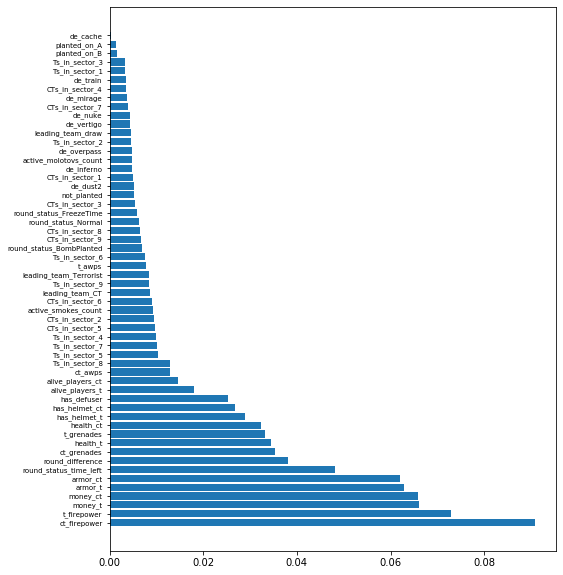

<Figure size 7200x7200 with 0 Axes>

In [68]:
importance = pd.DataFrame({
    'values': model.feature_importances_,
    'features': features}).sort_values(by=["values"], ascending = False) 
plt.barh(importance["features"], importance["values"])
plt.yticks(size= 7)
plt.figure(figsize=(100, 100))
plt.show() 


In [74]:
importance[:10]

,values,features
37,0.090802,ct_firepower
38,0.073026,t_firepower
31,0.065994,money_t
30,0.065962,money_ct
36,0.062932,armor_t
35,0.062118,armor_ct
0,0.048042,round_status_time_left
19,0.038195,round_difference
22,0.035273,ct_grenades
29,0.034402,health_t


# Feature Scaling

#### 1. Standard scaling

In [9]:
%%time
sc = StandardScaler()
X = sc.fit_transform(X)

Wall time: 211 ms


In [10]:
X[0]

array([-0.97591901, -0.38158758, -0.2531877 ,  2.17374877, -0.31148787,
       -0.37796892, -0.23567869, -0.25776228, -0.45354022, -0.60898317,
       -0.66752385, -0.61820739, -0.44136531, -0.25282149,  0.62928949,
       -0.39774809,  1.96165678, -0.39528514, -0.40047936, -1.21834056,
       -0.67935207, -0.86522813, -1.01850948, -1.0176153 , -0.64648082,
       -0.36911317,  0.60731048,  0.61002993,  0.67346075,  0.7058639 ,
       -0.52556542, -0.60043459, -1.01308339, -1.13286322, -1.41437889,
       -1.8406031 , -1.71806005, -1.36132951, -1.35982257, -0.04077471,
        2.1502857 , -0.50832513, -0.41697069, -0.39578263, -0.39829406,
       -0.33097744, -0.3258653 , -0.35685266,  1.6696832 , -1.28560848,
       -0.85527345, -0.92216866,  2.73447273,  0.35685266, -0.24938522,
       -0.2398712 ])

#### Splitting the data

In [11]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle = True, random_state = 42)

# Building the neural network

#### 1. Standard Training

In [ ]:
os.chdir(r"C:\Users\Áron\Desktop\Courses\csgo-ai-competition-master")
#BEST: BS - 64 LR - 0.001 DO - 0.25 BNM - 0.9
batch_size = 64
dropout = 0.25
lr = 0.001

log_dir = r".\runs\a"
tensorboard = TensorBoard(log_dir = log_dir, profile_batch = 100000000)

model = Sequential()

model.add(Dense(128,  input_shape = (56,), kernel_initializer="he_normal"))
model.add(Activation("relu"))
model.add(BatchNormalization(momentum = 0.9))
model.add(Dropout(rate=dropout))

model.add(Dense(512, kernel_initializer="he_normal"))
model.add(Activation("relu"))
model.add(BatchNormalization(momentum = 0.9))
model.add(Dropout(rate=dropout))

model.add(Dense(128, kernel_initializer="he_normal"))
model.add(Activation("relu"))
model.add(BatchNormalization(momentum = 0.9))
model.add(Dropout(rate=dropout))


model.add(Dense(1, kernel_initializer="he_normal"))
model.add(Activation("sigmoid"))

opt = tf.keras.optimizers.Adam(learning_rate = lr )
model.compile(optimizer = opt, loss =  'binary_crossentropy', metrics = ['accuracy'])


model.fit(X_train, y_train, epochs = 1000, validation_data=(X_test, y_test), callbacks = [tensorboard])

Train on 78623 samples, validate on 8736 samples
Epoch 1/1000
78623/78623 [==============================] - 16s 199us/sample - loss: 0.5710 - accuracy: 0.6868 - val_loss: 0.5196 - val_accuracy: 0.7063
Epoch 2/1000
78623/78623 [==============================] - 15s 197us/sample - loss: 0.5359 - accuracy: 0.7037 - val_loss: 0.5170 - val_accuracy: 0.7095
Epoch 3/1000
78623/78623 [==============================] - 15s 184us/sample - loss: 0.5323 - accuracy: 0.7084 - val_loss: 0.5236 - val_accuracy: 0.7026
Epoch 4/1000
78623/78623 [==============================] - 14s 178us/sample - loss: 0.5270 - accuracy: 0.7100 - val_loss: 0.5170 - val_accuracy: 0.7101
Epoch 5/1000
78623/78623 [==============================] - 13s 167us/sample - loss: 0.5254 - accuracy: 0.7117 - val_loss: 0.5098 - val_accuracy: 0.7184
Epoch 6/1000
78623/78623 [==============================] - 17s 213us/sample - loss: 0.5236 - accuracy: 0.7126 - val_loss: 0.5106 - val_accuracy: 0.7159
Epoch 7/1000
78623/78623 [=======

Epoch 54/1000
78623/78623 [==============================] - 14s 182us/sample - loss: 0.4800 - accuracy: 0.7451 - val_loss: 0.4883 - val_accuracy: 0.7344
Epoch 55/1000
78623/78623 [==============================] - 14s 177us/sample - loss: 0.4790 - accuracy: 0.7460 - val_loss: 0.4884 - val_accuracy: 0.7358
Epoch 56/1000
78623/78623 [==============================] - 14s 181us/sample - loss: 0.4781 - accuracy: 0.7504 - val_loss: 0.4882 - val_accuracy: 0.7368
Epoch 57/1000
78623/78623 [==============================] - 14s 174us/sample - loss: 0.4774 - accuracy: 0.7480 - val_loss: 0.4904 - val_accuracy: 0.7308
Epoch 58/1000
78623/78623 [==============================] - 14s 178us/sample - loss: 0.4788 - accuracy: 0.7478 - val_loss: 0.4904 - val_accuracy: 0.7297
Epoch 59/1000
78623/78623 [==============================] - 14s 181us/sample - loss: 0.4776 - accuracy: 0.7474 - val_loss: 0.4884 - val_accuracy: 0.7347
Epoch 60/1000
78623/78623 [==============================] - 14s 179us/sampl

78623/78623 [==============================] - 13s 166us/sample - loss: 0.4632 - accuracy: 0.7607 - val_loss: 0.4801 - val_accuracy: 0.7416
Epoch 108/1000
78623/78623 [==============================] - 15s 195us/sample - loss: 0.4621 - accuracy: 0.7598 - val_loss: 0.4827 - val_accuracy: 0.7452
Epoch 109/1000
78623/78623 [==============================] - 17s 215us/sample - loss: 0.4620 - accuracy: 0.7606 - val_loss: 0.4818 - val_accuracy: 0.7436
Epoch 110/1000
78623/78623 [==============================] - 16s 201us/sample - loss: 0.4617 - accuracy: 0.7615 - val_loss: 0.4809 - val_accuracy: 0.7407
Epoch 111/1000
78623/78623 [==============================] - 15s 190us/sample - loss: 0.4625 - accuracy: 0.7583 - val_loss: 0.4817 - val_accuracy: 0.7412
Epoch 112/1000
78623/78623 [==============================] - 13s 170us/sample - loss: 0.4604 - accuracy: 0.7605 - val_loss: 0.4812 - val_accuracy: 0.7394
Epoch 113/1000
78623/78623 [==============================] - 17s 211us/sample - loss

### Saving the model

In [14]:
from keras.models import load_model
model.save('dummy_model.h5')

#### 3. Grid search

In [32]:
%%time
from random import randrange
def build_classifier(unit, lr, do_rate):
    model = Sequential()

    model.add(Dense(units = 128,  input_dim = 56, kernel_initializer="he_normal"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(momentum = 0.9))
    model.add(Dropout(rate=do_rate))

    model.add(Dense(units = unit, kernel_initializer="he_normal"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(momentum = 0.9))
    model.add(Dropout(rate=do_rate))

    model.add(Dense(units = 128, kernel_initializer="he_normal"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(momentum = 0.9))
    model.add(Dropout(rate=do_rate))

    model.add(Dense(units = 1, kernel_initializer="he_normal"))
    model.add(Activation("sigmoid"))

    opt = keras.optimizers.Adam(learning_rate = lr )
    model.compile(optimizer = opt, loss =  'binary_crossentropy', metrics = ['accuracy'])
    return model

model = KerasClassifier(build_fn= build_classifier )
parameters = {"unit": [512],
              "lr":[0.001],
              "batch_size": [64],
             "do_rate":[0.25]}
grid_search = GridSearchCV(estimator=model, param_grid=parameters, scoring="accuracy", cv=5)
grid_search = grid_search.fit(X_train,y_train, validation_data=(X_test, y_test), 
                               epochs = 50, verbose=1)

best_parameters =grid_search.best_params_
best_accuracy = grid_search.best_score_
result = grid_search.cv_results_
scores = grid_search.grid_scores_

Train on 62898 samples, validate on 8736 samples
Epoch 1/50
62898/62898 [==============================] - 12s 193us/step - loss: 0.5874 - accuracy: 0.6751 - val_loss: 0.5237 - val_accuracy: 0.7081
Epoch 2/50
48256/62898 [======================>.......] - ETA: 2s - loss: 0.5400 - accuracy: 0.6983

KeyboardInterrupt: 

#### Cross validation

In [30]:
print("Parameters: ",parameters)
print("Best_parameters: ",best_parameters)
print("Best_accuracy: ",best_accuracy)
print(result)
print("All average: ",result.get("mean_test_score").mean())

Parameters:  {'unit': [128, 56], 'lr': [0.001], 'batch_size': [64], 'do_rate': [0.25]}
Best_parameters:  {'batch_size': 64, 'do_rate': 0.25, 'lr': 0.001, 'unit': 128}
Best_accuracy:  0.7283874295832037
{'mean_fit_time': array([523.96204152, 547.5988265 ]), 'std_fit_time': array([11.72941246, 15.42225737]), 'mean_score_time': array([1.20086675, 1.59134583]), 'std_score_time': array([0.10218534, 0.14977316]), 'param_batch_size': masked_array(data=[64, 64],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_do_rate': masked_array(data=[0.25, 0.25],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_lr': masked_array(data=[0.001, 0.001],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_unit': masked_array(data=[128, 56],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'params': [{'batch_size': 64, 'do_rate': 0.25, 'lr': 0.001, 'unit':

# Model evaluation and testing

In [165]:
pred = model.predict(X_test)
res_df = pd.DataFrame (sc.inverse_transform(X_test), columns = columns, dtype=int)

In [166]:
index = 0
probs = []
for i in pred:
    if i < 0.5:
        print(f"Winning team: CT, probability: {1-i.item()}")
    else:
        print(f"Winning team: T, probability: {i.item()}")
        
    print(res_df.iloc[index,:])
    print()
    index += 1
    probs.append(i.item())    

Winning team: T, probability: 0.5018535256385803
round_status_time_left         19
CTs_in_sector_1                 0
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  0
CTs_in_sector_3                 0
Ts_in_sector_3                  0
CTs_in_sector_4                 0
Ts_in_sector_4                  0
CTs_in_sector_5                 0
Ts_in_sector_5                  0
CTs_in_sector_6                 0
Ts_in_sector_6                  5
CTs_in_sector_7                 4
Ts_in_sector_7                  0
CTs_in_sector_8                 1
Ts_in_sector_8                  0
CTs_in_sector_9                 0
Ts_in_sector_9                  0
round_difference                2
t_awps                          0
ct_awps                         1
ct_grenades                     1
t_grenades                      0
active_smokes_count             0
active_molotovs_count           0
alive_players_t                 5
alive_players_ct                5

round_status_time_left        20
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                5
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 0
CTs_in_sector_5                0
Ts_in_sector_5                 0
CTs_in_sector_6                0
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 2
CTs_in_sector_8                0
Ts_in_sector_8                 3
CTs_in_sector_9                0
Ts_in_sector_9                 0
round_difference               3
t_awps                         0
ct_awps                        0
ct_grenades                    2
t_grenades                     6
active_smokes_count            0
active_molotovs_count          0
alive_players_t                5
alive_players_ct               5
health_ct                    500
health_t                     500
money_ct  


Winning team: CT, probability: 0.9929771721363068
round_status_time_left        13
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                0
Ts_in_sector_2                 1
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 0
CTs_in_sector_5                4
Ts_in_sector_5                 0
CTs_in_sector_6                1
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 0
round_difference               7
t_awps                         0
ct_awps                        0
ct_grenades                    5
t_grenades                     2
active_smokes_count            0
active_molotovs_count          0
alive_players_t                0
alive_players_ct               5
health_ct                

Name: 559, dtype: int32

Winning team: CT, probability: 0.5168474912643433
round_status_time_left         0
CTs_in_sector_1                0
Ts_in_sector_1                 5
CTs_in_sector_2                0
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 0
CTs_in_sector_5                0
Ts_in_sector_5                 0
CTs_in_sector_6                0
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                5
Ts_in_sector_9                 0
round_difference               3
t_awps                         1
ct_awps                        1
ct_grenades                   20
t_grenades                    17
active_smokes_count            0
active_molotovs_count          0
alive_players_t                5
alive_players_ct               5
h

Name: 721, dtype: int32

Winning team: T, probability: 0.6482378244400024
round_status_time_left        10
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                5
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 0
CTs_in_sector_5                0
Ts_in_sector_5                 0
CTs_in_sector_6                0
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 1
CTs_in_sector_8                0
Ts_in_sector_8                 4
CTs_in_sector_9                0
Ts_in_sector_9                 0
round_difference               6
t_awps                         1
ct_awps                        0
ct_grenades                    9
t_grenades                    13
active_smokes_count            0
active_molotovs_count          0
alive_players_t                5
alive_players_ct               5
he

Name: 878, dtype: int32

Winning team: CT, probability: 0.6583088636398315
round_status_time_left        54
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                1
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 0
CTs_in_sector_5                2
Ts_in_sector_5                 2
CTs_in_sector_6                1
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 1
round_difference               9
t_awps                         0
ct_awps                        0
ct_grenades                    1
t_grenades                     8
active_smokes_count            1
active_molotovs_count          0
alive_players_t                3
alive_players_ct               4
h

Name: 1030, dtype: int32

Winning team: T, probability: 0.618419349193573
round_status_time_left       90
CTs_in_sector_1               0
Ts_in_sector_1                0
CTs_in_sector_2               1
Ts_in_sector_2                0
CTs_in_sector_3               0
Ts_in_sector_3                0
CTs_in_sector_4               0
Ts_in_sector_4                0
CTs_in_sector_5               0
Ts_in_sector_5                5
CTs_in_sector_6               2
Ts_in_sector_6                0
CTs_in_sector_7               0
Ts_in_sector_7                0
CTs_in_sector_8               0
Ts_in_sector_8                0
CTs_in_sector_9               2
Ts_in_sector_9                0
round_difference              1
t_awps                        0
ct_awps                       0
ct_grenades                   4
t_grenades                    2
active_smokes_count           0
active_molotovs_count         0
alive_players_t               5
alive_players_ct              5
health_ct                   50

Winning team: T, probability: 0.7769291996955872
round_status_time_left        34
CTs_in_sector_1                0
Ts_in_sector_1                 2
CTs_in_sector_2                2
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 1
CTs_in_sector_5                0
Ts_in_sector_5                 0
CTs_in_sector_6                0
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 0
round_difference               3
t_awps                         0
ct_awps                        1
ct_grenades                    1
t_grenades                     2
active_smokes_count            1
active_molotovs_count          0
alive_players_t                3
alive_players_ct               2
health_ct                  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



round_status_time_left        20
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                0
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 3
CTs_in_sector_5                0
Ts_in_sector_5                 0
CTs_in_sector_6                5
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 2
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 0
round_difference               1
t_awps                         0
ct_awps                        0
ct_grenades                    8
t_grenades                     4
active_smokes_count            0
active_molotovs_count          0
alive_players_t                5
alive_players_ct               5
health_ct                    500
health_t                     500
money_ct  

Name: 2823, dtype: int32

Winning team: CT, probability: 0.7390058636665344
round_status_time_left         19
CTs_in_sector_1                 0
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  0
CTs_in_sector_3                 0
Ts_in_sector_3                  0
CTs_in_sector_4                 0
Ts_in_sector_4                  5
CTs_in_sector_5                 0
Ts_in_sector_5                  0
CTs_in_sector_6                 5
Ts_in_sector_6                  0
CTs_in_sector_7                 0
Ts_in_sector_7                  0
CTs_in_sector_8                 0
Ts_in_sector_8                  0
CTs_in_sector_9                 0
Ts_in_sector_9                  0
round_difference                2
t_awps                          0
ct_awps                         0
ct_grenades                     4
t_grenades                      0
active_smokes_count             0
active_molotovs_count           0
alive_players_t                 5
alive_

Name: 2968, dtype: int32

Winning team: CT, probability: 0.500715047121048
round_status_time_left         19
CTs_in_sector_1                 0
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  0
CTs_in_sector_3                 0
Ts_in_sector_3                  0
CTs_in_sector_4                 0
Ts_in_sector_4                  2
CTs_in_sector_5                 0
Ts_in_sector_5                  0
CTs_in_sector_6                 5
Ts_in_sector_6                  0
CTs_in_sector_7                 0
Ts_in_sector_7                  3
CTs_in_sector_8                 0
Ts_in_sector_8                  0
CTs_in_sector_9                 0
Ts_in_sector_9                  0
round_difference                1
t_awps                          0
ct_awps                         0
ct_grenades                     8
t_grenades                      0
active_smokes_count             0
active_molotovs_count           0
alive_players_t                 5
alive_p

round_status_time_left        20
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                0
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 5
CTs_in_sector_5                0
Ts_in_sector_5                 0
CTs_in_sector_6                5
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 0
round_difference               5
t_awps                         0
ct_awps                        0
ct_grenades                    1
t_grenades                     5
active_smokes_count            0
active_molotovs_count          0
alive_players_t                5
alive_players_ct               5
health_ct                    500
health_t                     500
money_ct  

Name: 3320, dtype: int32

Winning team: CT, probability: 0.9603278636932373
round_status_time_left        54
CTs_in_sector_1                2
Ts_in_sector_1                 1
CTs_in_sector_2                0
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 3
CTs_in_sector_5                2
Ts_in_sector_5                 0
CTs_in_sector_6                0
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                1
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 0
round_difference               3
t_awps                         0
ct_awps                        0
ct_grenades                   10
t_grenades                     2
active_smokes_count            0
active_molotovs_count          0
alive_players_t                4
alive_players_ct               5


Name: 3474, dtype: int32

Winning team: T, probability: 0.7855918407440186
round_status_time_left        34
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                2
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 0
CTs_in_sector_5                0
Ts_in_sector_5                 4
CTs_in_sector_6                0
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                1
Ts_in_sector_9                 0
round_difference               3
t_awps                         1
ct_awps                        1
ct_grenades                    6
t_grenades                    10
active_smokes_count            0
active_molotovs_count          0
alive_players_t                4
alive_players_ct               3
h

Winning team: CT, probability: 0.6327681243419647
round_status_time_left         20
CTs_in_sector_1                 0
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  0
CTs_in_sector_3                 0
Ts_in_sector_3                  0
CTs_in_sector_4                 0
Ts_in_sector_4                  0
CTs_in_sector_5                 0
Ts_in_sector_5                  0
CTs_in_sector_6                 0
Ts_in_sector_6                  5
CTs_in_sector_7                 4
Ts_in_sector_7                  0
CTs_in_sector_8                 1
Ts_in_sector_8                  0
CTs_in_sector_9                 0
Ts_in_sector_9                  0
round_difference                6
t_awps                          0
ct_awps                         1
ct_grenades                    18
t_grenades                      0
active_smokes_count             0
active_molotovs_count           0
alive_players_t                 5
alive_players_ct                

Name: 3765, dtype: int32

Winning team: CT, probability: 0.5402339696884155
round_status_time_left        20
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                0
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 5
CTs_in_sector_5                0
Ts_in_sector_5                 0
CTs_in_sector_6                5
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 0
round_difference               3
t_awps                         0
ct_awps                        0
ct_grenades                    0
t_grenades                     6
active_smokes_count            0
active_molotovs_count          0
alive_players_t                5
alive_players_ct               5


Name: 3903, dtype: int32

Winning team: CT, probability: 0.5013534724712372
round_status_time_left       114
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                0
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 0
CTs_in_sector_5                0
Ts_in_sector_5                 0
CTs_in_sector_6                0
Ts_in_sector_6                 5
CTs_in_sector_7                5
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 0
round_difference               4
t_awps                         1
ct_awps                        1
ct_grenades                   19
t_grenades                    19
active_smokes_count            0
active_molotovs_count          0
alive_players_t                5
alive_players_ct               5


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





Winning team: CT, probability: 0.543209969997406
round_status_time_left        107
CTs_in_sector_1                 0
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  1
CTs_in_sector_3                 0
Ts_in_sector_3                  0
CTs_in_sector_4                 1
Ts_in_sector_4                  0
CTs_in_sector_5                 1
Ts_in_sector_5                  0
CTs_in_sector_6                 0
Ts_in_sector_6                  4
CTs_in_sector_7                 0
Ts_in_sector_7                  0
CTs_in_sector_8                 3
Ts_in_sector_8                  0
CTs_in_sector_9                 0
Ts_in_sector_9                  0
round_difference               10
t_awps                          1
ct_awps                         1
ct_grenades                    17
t_grenades                     13
active_smokes_count             1
active_molotovs_count           0
alive_players_t                 5
alive_players_ct               

Winning team: CT, probability: 0.5431763231754303
round_status_time_left        101
CTs_in_sector_1                 2
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  2
CTs_in_sector_3                 0
Ts_in_sector_3                  2
CTs_in_sector_4                 0
Ts_in_sector_4                  0
CTs_in_sector_5                 2
Ts_in_sector_5                  0
CTs_in_sector_6                 0
Ts_in_sector_6                  1
CTs_in_sector_7                 0
Ts_in_sector_7                  0
CTs_in_sector_8                 0
Ts_in_sector_8                  0
CTs_in_sector_9                 1
Ts_in_sector_9                  0
round_difference                0
t_awps                          1
ct_awps                         1
ct_grenades                    16
t_grenades                     17
active_smokes_count             2
active_molotovs_count           1
alive_players_t                 5
alive_players_ct                

Winning team: T, probability: 0.5354697108268738
round_status_time_left        58
CTs_in_sector_1                2
Ts_in_sector_1                 0
CTs_in_sector_2                0
Ts_in_sector_2                 1
CTs_in_sector_3                2
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 1
CTs_in_sector_5                0
Ts_in_sector_5                 2
CTs_in_sector_6                1
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 1
round_difference               1
t_awps                         1
ct_awps                        1
ct_grenades                   10
t_grenades                     8
active_smokes_count            0
active_molotovs_count          0
alive_players_t                5
alive_players_ct               5
health_ct                  

Name: 5890, dtype: int32

Winning team: T, probability: 0.5007991194725037
round_status_time_left        20
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                5
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 0
CTs_in_sector_5                0
Ts_in_sector_5                 0
CTs_in_sector_6                0
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 4
CTs_in_sector_9                0
Ts_in_sector_9                 1
round_difference               0
t_awps                         0
ct_awps                        0
ct_grenades                    2
t_grenades                     2
active_smokes_count            0
active_molotovs_count          0
alive_players_t                5
alive_players_ct               5
h

Winning team: CT, probability: 0.9280727207660675
round_status_time_left         54
CTs_in_sector_1                 0
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  0
CTs_in_sector_3                 0
Ts_in_sector_3                  0
CTs_in_sector_4                 0
Ts_in_sector_4                  3
CTs_in_sector_5                 2
Ts_in_sector_5                  0
CTs_in_sector_6                 1
Ts_in_sector_6                  0
CTs_in_sector_7                 0
Ts_in_sector_7                  1
CTs_in_sector_8                 1
Ts_in_sector_8                  0
CTs_in_sector_9                 1
Ts_in_sector_9                  0
round_difference                6
t_awps                          0
ct_awps                         1
ct_grenades                     6
t_grenades                      2
active_smokes_count             2
active_molotovs_count           2
alive_players_t                 4
alive_players_ct                

Winning team: T, probability: 0.6115589141845703
round_status_time_left         19
CTs_in_sector_1                 0
Ts_in_sector_1                  0
CTs_in_sector_2                 5
Ts_in_sector_2                  0
CTs_in_sector_3                 0
Ts_in_sector_3                  0
CTs_in_sector_4                 0
Ts_in_sector_4                  0
CTs_in_sector_5                 0
Ts_in_sector_5                  0
CTs_in_sector_6                 0
Ts_in_sector_6                  0
CTs_in_sector_7                 0
Ts_in_sector_7                  0
CTs_in_sector_8                 0
Ts_in_sector_8                  3
CTs_in_sector_9                 0
Ts_in_sector_9                  2
round_difference                7
t_awps                          0
ct_awps                         0
ct_grenades                     0
t_grenades                      0
active_smokes_count             0
active_molotovs_count           0
alive_players_t                 5
alive_players_ct                5


Winning team: T, probability: 0.540532648563385
round_status_time_left         94
CTs_in_sector_1                 0
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  0
CTs_in_sector_3                 0
Ts_in_sector_3                  0
CTs_in_sector_4                 0
Ts_in_sector_4                  0
CTs_in_sector_5                 2
Ts_in_sector_5                  1
CTs_in_sector_6                 1
Ts_in_sector_6                  0
CTs_in_sector_7                 0
Ts_in_sector_7                  1
CTs_in_sector_8                 0
Ts_in_sector_8                  3
CTs_in_sector_9                 2
Ts_in_sector_9                  0
round_difference                2
t_awps                          0
ct_awps                         1
ct_grenades                    10
t_grenades                     16
active_smokes_count             1
active_molotovs_count           2
alive_players_t                 5
alive_players_ct                5

Name: 6542, dtype: int32

Winning team: T, probability: 0.9874569177627563
round_status_time_left         15
CTs_in_sector_1                 0
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  1
CTs_in_sector_3                 0
Ts_in_sector_3                  2
CTs_in_sector_4                 0
Ts_in_sector_4                  0
CTs_in_sector_5                 0
Ts_in_sector_5                  1
CTs_in_sector_6                 0
Ts_in_sector_6                  1
CTs_in_sector_7                 0
Ts_in_sector_7                  0
CTs_in_sector_8                 2
Ts_in_sector_8                  0
CTs_in_sector_9                 2
Ts_in_sector_9                  0
round_difference                2
t_awps                          1
ct_awps                         0
ct_grenades                     3
t_grenades                      8
active_smokes_count             0
active_molotovs_count           0
alive_players_t                 5
alive_p

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





Winning team: T, probability: 0.8791970610618591
round_status_time_left        37
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                0
Ts_in_sector_2                 0
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 0
CTs_in_sector_5                3
Ts_in_sector_5                 3
CTs_in_sector_6                0
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 1
round_difference               5
t_awps                         0
ct_awps                        0
ct_grenades                    0
t_grenades                     1
active_smokes_count            2
active_molotovs_count          0
alive_players_t                4
alive_players_ct               3
health_ct                


Winning team: T, probability: 0.6696268320083618
round_status_time_left         74
CTs_in_sector_1                 2
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  0
CTs_in_sector_3                 2
Ts_in_sector_3                  0
CTs_in_sector_4                 0
Ts_in_sector_4                  1
CTs_in_sector_5                 0
Ts_in_sector_5                  0
CTs_in_sector_6                 0
Ts_in_sector_6                  4
CTs_in_sector_7                 0
Ts_in_sector_7                  0
CTs_in_sector_8                 0
Ts_in_sector_8                  0
CTs_in_sector_9                 0
Ts_in_sector_9                  0
round_difference                6
t_awps                          1
ct_awps                         1
ct_grenades                    10
t_grenades                     14
active_smokes_count             0
active_molotovs_count           0
alive_players_t                 5
alive_players_ct                

Name: 8482, dtype: int32

Winning team: T, probability: 0.7621581554412842
round_status_time_left         20
CTs_in_sector_1                 0
Ts_in_sector_1                  0
CTs_in_sector_2                 0
Ts_in_sector_2                  0
CTs_in_sector_3                 0
Ts_in_sector_3                  0
CTs_in_sector_4                 0
Ts_in_sector_4                  3
CTs_in_sector_5                 0
Ts_in_sector_5                  0
CTs_in_sector_6                 5
Ts_in_sector_6                  0
CTs_in_sector_7                 0
Ts_in_sector_7                  2
CTs_in_sector_8                 0
Ts_in_sector_8                  0
CTs_in_sector_9                 0
Ts_in_sector_9                  0
round_difference                1
t_awps                          1
ct_awps                         0
ct_grenades                     4
t_grenades                     12
active_smokes_count             0
active_molotovs_count           0
alive_players_t                 5
alive_p

Name: 8673, dtype: int32

Winning team: T, probability: 0.9960289001464844
round_status_time_left        20
CTs_in_sector_1                0
Ts_in_sector_1                 0
CTs_in_sector_2                1
Ts_in_sector_2                 1
CTs_in_sector_3                0
Ts_in_sector_3                 0
CTs_in_sector_4                0
Ts_in_sector_4                 0
CTs_in_sector_5                0
Ts_in_sector_5                 0
CTs_in_sector_6                0
Ts_in_sector_6                 0
CTs_in_sector_7                0
Ts_in_sector_7                 0
CTs_in_sector_8                0
Ts_in_sector_8                 0
CTs_in_sector_9                0
Ts_in_sector_9                 3
round_difference               4
t_awps                         0
ct_awps                        0
ct_grenades                    0
t_grenades                     2
active_smokes_count            0
active_molotovs_count          0
alive_players_t                4
alive_players_ct               1
h

In [167]:
print("Mean: ",np.mean(probs))
print("Variance:", np.std(probs))

Mean:  0.5318411443989738
Variance: 0.2573913891767404


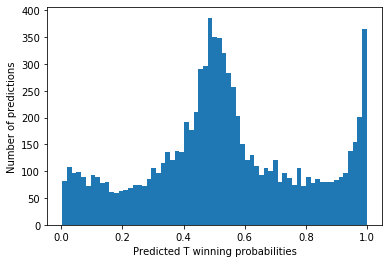

In [168]:
plt.hist(probs, bins = 65)
plt.xlabel("Predicted T winning probabilities")
plt.ylabel("Number of predictions")
plt.show()